# <font color = red> **Recommender System using the Apriori algorithm**

Dataset Link: https://www.kaggle.com/kaggle/recipe-ingredients-dataset

## Context 
If you're in Northern California, you'll be walking past the inevitable bushels of leafy greens, spiked with dark purple kale and the bright pinks and yellows of chard. Across the world in South Korea, mounds of bright red kimchi greet you, while the smell of the sea draws your attention to squids squirming nearby. India’s market is perhaps the most colorful, awash in the rich hues and aromas of dozens of spices: turmeric, star anise, poppy seeds, and garam masala as far as the eye can see. Some of our strongest geographic and cultural associations are tied to a region's local foods.

We're going to build a recommender system using the recipes data and the Apriori algorithm.

In [75]:
import re
import seaborn as sns
import matplotlib.pyplot as plt
from itertools import combinations

## Data Import

In [76]:
import json
recipes = json.load(open("./data/train.json", "r"))

for i, recipe in enumerate(recipes):
    print(recipe,"\n")
    if i == 4:
        break

{'id': 10259, 'cuisine': 'greek', 'ingredients': ['feta cheese crumbles', 'garlic', 'seasoning', 'grape tomatoes', 'black olives', 'garbanzo beans', 'pepper', 'purple onion', 'romaine lettuce']} 

{'id': 25693, 'cuisine': 'southern_us', 'ingredients': ['ground pepper', 'ground black pepper', 'vegetable oil', 'plain flour', 'thyme', 'salt', 'green tomatoes', 'milk', 'yellow corn meal', 'eggs', 'tomatoes']} 

{'id': 20130, 'cuisine': 'filipino', 'ingredients': ['butter', 'green chilies', 'cooking oil', 'chicken livers', 'pepper', 'salt', 'grilled chicken breasts', 'garlic powder', 'soy sauce', 'mayonaise', 'yellow onion', 'eggs']} 

{'id': 22213, 'cuisine': 'indian', 'ingredients': ['salt', 'water', 'wheat', 'vegetable oil']} 

{'id': 13162, 'cuisine': 'indian', 'ingredients': ['butter', 'cayenne pepper', 'onions', 'black pepper', 'ground cumin', 'cornflour', 'boneless chicken skinless thigh', 'lemon juice', 'double cream', 'salt', 'water', 'garam masala', 'bay leaf', 'natural yogurt', '

### Writing a function that counts the number of recipes that includes each `ingredient`

In [77]:
from collections import Counter

In [78]:
def count_items(recipes):
    counts = Counter()
    for recipe in recipes:
        for item in recipe['ingredients']:
            counts[tuple([item])] += 1
            
    return(counts)

In [79]:
candidates_1 = count_items(recipes)

In [80]:
candidates_1.keys() #All the ingedients

dict_keys([('feta cheese crumbles',), ('garlic',), ('seasoning',), ('grape tomatoes',), ('black olives',), ('garbanzo beans',), ('pepper',), ('purple onion',), ('romaine lettuce',), ('ground pepper',), ('ground black pepper',), ('vegetable oil',), ('plain flour',), ('thyme',), ('salt',), ('green tomatoes',), ('milk',), ('yellow corn meal',), ('eggs',), ('tomatoes',), ('butter',), ('green chilies',), ('cooking oil',), ('chicken livers',), ('grilled chicken breasts',), ('garlic powder',), ('soy sauce',), ('mayonaise',), ('yellow onion',), ('water',), ('wheat',), ('cayenne pepper',), ('onions',), ('black pepper',), ('ground cumin',), ('cornflour',), ('boneless chicken skinless thigh',), ('lemon juice',), ('double cream',), ('garam masala',), ('bay leaf',), ('natural yogurt',), ('garlic paste',), ('chili powder',), ('shallots',), ('passata',), ('oil',), ('ground cinnamon',), ('powdered sugar',), ('baking powder',), ('ground ginger',), ('fresh ginger root',), ('sugar',), ('vanilla extract',

In [81]:
len(candidates_1.keys())

6714

In [82]:
most = candidates_1.most_common()[:25]

In [83]:
most

[(('salt',), 18048),
 (('onions',), 7972),
 (('olive oil',), 7971),
 (('water',), 7457),
 (('garlic',), 7380),
 (('sugar',), 6434),
 (('garlic cloves',), 6236),
 (('butter',), 4847),
 (('ground black pepper',), 4784),
 (('all-purpose flour',), 4632),
 (('pepper',), 4438),
 (('vegetable oil',), 4385),
 (('eggs',), 3388),
 (('soy sauce',), 3296),
 (('kosher salt',), 3113),
 (('green onions',), 3078),
 (('tomatoes',), 3058),
 (('large eggs',), 2948),
 (('carrots',), 2814),
 (('unsalted butter',), 2782),
 (('ground cumin',), 2747),
 (('extra-virgin olive oil',), 2747),
 (('black pepper',), 2627),
 (('milk',), 2263),
 (('chili powder',), 2036)]

<font color = red>**There are 6714 ingredients present in total in the recipes dataset.**

Now, writing a function which accepts a `Counter` of `ingredients`, i.e., item or itemset counts, and stores only those with count above the determined `threshold` value in a separate counter.

In [84]:
def store_frequent(count, threshold = 25):
    frequent = Counter()         
    for itemset in count:
        if count[itemset] >= threshold:
            frequent[itemset] = count[itemset]
    return(frequent)

In [85]:
freq_1 = store_frequent(candidates_1,25)

In [86]:
freq_1 # All the ingredients which occur more than 25 times in the recipes dataset. 

Counter({('feta cheese crumbles',): 358,
         ('garlic',): 7380,
         ('seasoning',): 137,
         ('grape tomatoes',): 228,
         ('black olives',): 229,
         ('garbanzo beans',): 148,
         ('pepper',): 4438,
         ('purple onion',): 1896,
         ('romaine lettuce',): 270,
         ('ground pepper',): 385,
         ('ground black pepper',): 4784,
         ('vegetable oil',): 4385,
         ('plain flour',): 154,
         ('thyme',): 361,
         ('salt',): 18048,
         ('green tomatoes',): 108,
         ('milk',): 2263,
         ('yellow corn meal',): 341,
         ('eggs',): 3388,
         ('tomatoes',): 3058,
         ('butter',): 4847,
         ('green chilies',): 768,
         ('cooking oil',): 483,
         ('chicken livers',): 65,
         ('garlic powder',): 1442,
         ('soy sauce',): 3296,
         ('mayonaise',): 781,
         ('yellow onion',): 1184,
         ('water',): 7457,
         ('wheat',): 26,
         ('cayenne pepper',): 1523,
     

## Visualization

In [87]:
def barplot(count, title, top):
## a little more pre-processing to fix the labels
    most = count.most_common()[:top]
    labels = []
    for  x in most:
        labels.append(x[0][0])
    labels = [re.sub("_", "\n",label)for label in labels]

    ## It's width by height, so let's make this one wide!
    bar_fig = plt.figure(figsize = (12, 6))
    
    ## note the plot.bar() function takes an x-positon for bars
    ## in the event that data are not categorical,
    ## but we'll just use discrete positioning, i.e., left = [1,2,3, ...]
    ## to space out the bars
    _  = plt.bar(
        x = range(1, len(most) + 1),
        height = list(x[1] for x in most),
        tick_label = labels,
    color='burlywood', alpha=1, width=0.5)

    ## Set the tick and label fontsize
    plt.tick_params(labelsize = 15)

    ## Set the title
    _ = plt.title(title, fontsize = 15)

    ## Set the y-label
    _ = plt.ylabel("Number of Ingredients", fontsize = 15)

    ## rotate the x-tick labels
    _ = plt.xticks(rotation = 90)

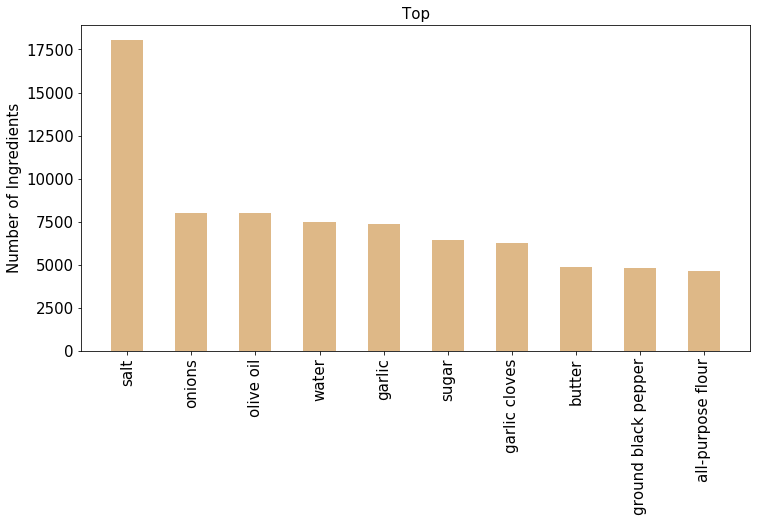

In [88]:
barplot(candidates_1,"Top",10)

<font color = red>**We have found the frequently occuring items(ingredients) above. Now we can find how many of them occur as a set using the `combinations()` function.** 

In [89]:
def get_next(recipes, frequent, threshold = 25):
    next_candidates = Counter()

    size = len(list(frequent.keys())[0]) + 1
    for recipe in recipes:
        
        if len(recipe['ingredients']) >= size:
            for itemset in combinations(recipe['ingredients'], size):
                itemset = tuple(sorted(itemset))
                
                if itemset in next_candidates:
                    next_candidates[itemset] += 1
                elif all([tuple(sorted(subset)) in frequent 
                          for subset in combinations(itemset, size - 1)]):
                    next_candidates[itemset] += 1
                    
    return(next_candidates)

## 2-Itemset

In [91]:
candidates_2 = get_next(recipes, freq_1, 25)

In [92]:
candidates_2.keys()

dict_keys([('feta cheese crumbles', 'garlic'), ('feta cheese crumbles', 'seasoning'), ('feta cheese crumbles', 'grape tomatoes'), ('black olives', 'feta cheese crumbles'), ('feta cheese crumbles', 'garbanzo beans'), ('feta cheese crumbles', 'pepper'), ('feta cheese crumbles', 'purple onion'), ('feta cheese crumbles', 'romaine lettuce'), ('garlic', 'seasoning'), ('garlic', 'grape tomatoes'), ('black olives', 'garlic'), ('garbanzo beans', 'garlic'), ('garlic', 'pepper'), ('garlic', 'purple onion'), ('garlic', 'romaine lettuce'), ('grape tomatoes', 'seasoning'), ('black olives', 'seasoning'), ('garbanzo beans', 'seasoning'), ('pepper', 'seasoning'), ('purple onion', 'seasoning'), ('romaine lettuce', 'seasoning'), ('black olives', 'grape tomatoes'), ('garbanzo beans', 'grape tomatoes'), ('grape tomatoes', 'pepper'), ('grape tomatoes', 'purple onion'), ('grape tomatoes', 'romaine lettuce'), ('black olives', 'garbanzo beans'), ('black olives', 'pepper'), ('black olives', 'purple onion'), ('b

In [93]:
len(candidates_2.keys()) 

283161

<font color = red>**There are 283161 2-itemset combinations from the ingredients.**

In [94]:
freq_2 = store_frequent(candidates_2,25)

In [95]:
len(freq_2)

15230

<font color = red>**15230 2-itemsets occur more than 25 times in the recipes dataset.** 

In [96]:
candidates_2.most_common(10) #Top 10 

[(('onions', 'salt'), 4392),
 (('olive oil', 'salt'), 4177),
 (('salt', 'water'), 3960),
 (('pepper', 'salt'), 3844),
 (('garlic', 'salt'), 3749),
 (('all-purpose flour', 'salt'), 3079),
 (('salt', 'sugar'), 3061),
 (('garlic cloves', 'salt'), 2995),
 (('butter', 'salt'), 2777),
 (('ground black pepper', 'salt'), 2734)]

## 3-Itemset

In [97]:
candidates_3 = get_next(recipes, freq_2, 25)

In [98]:
candidates_3.keys()

dict_keys([('feta cheese crumbles', 'garlic', 'pepper'), ('feta cheese crumbles', 'garlic', 'purple onion'), ('feta cheese crumbles', 'pepper', 'purple onion'), ('garlic', 'grape tomatoes', 'pepper'), ('garlic', 'grape tomatoes', 'purple onion'), ('black olives', 'garlic', 'pepper'), ('black olives', 'garlic', 'purple onion'), ('garbanzo beans', 'garlic', 'pepper'), ('garlic', 'pepper', 'purple onion'), ('garlic', 'pepper', 'romaine lettuce'), ('garlic', 'purple onion', 'romaine lettuce'), ('grape tomatoes', 'pepper', 'purple onion'), ('black olives', 'pepper', 'purple onion'), ('pepper', 'purple onion', 'romaine lettuce'), ('ground pepper', 'salt', 'vegetable oil'), ('eggs', 'ground pepper', 'vegetable oil'), ('ground pepper', 'tomatoes', 'vegetable oil'), ('eggs', 'ground pepper', 'salt'), ('ground pepper', 'salt', 'tomatoes'), ('eggs', 'ground pepper', 'tomatoes'), ('ground black pepper', 'thyme', 'vegetable oil'), ('ground black pepper', 'salt', 'vegetable oil'), ('ground black pep

In [99]:
len(candidates_3.keys())

212328

<font color = red>**There are 212328 3-itemset combinations from the ingredients.**

In [100]:
freq_3 = store_frequent(candidates_3,25)

In [101]:
len(freq_3)

24289

<font color = red> **24289 3-itemsets occur more than 25 times in the recipes dataset.**

In [102]:
candidates_3.most_common(10) #Top 10 

[(('garlic', 'onions', 'salt'), 1605),
 (('onions', 'pepper', 'salt'), 1342),
 (('onions', 'salt', 'water'), 1240),
 (('olive oil', 'onions', 'salt'), 1203),
 (('garlic', 'olive oil', 'salt'), 1185),
 (('garlic', 'pepper', 'salt'), 1170),
 (('olive oil', 'pepper', 'salt'), 1164),
 (('garlic cloves', 'olive oil', 'salt'), 1130),
 (('all-purpose flour', 'salt', 'sugar'), 954),
 (('ground black pepper', 'olive oil', 'salt'), 953)]

Now that we have the pieces to run Apriori/collect frequent itemsets it's time to package the process together, collecting all frequent itemsets up to a particular `size`.

In [103]:
def train(recipes, size = 4):
    candidates, frequent = {}, {}
    print("working on baskets of size ", 1)
    candidates[1] = count_items(recipes)
    frequent[1] = store_frequent(candidates_1)

    for i in range(2,size + 1):
        print("working on baskets of size ", i)
        candidates[i] = get_next(recipes, frequent[i-1])
        frequent[i] = store_frequent(candidates[i])
    return(candidates, frequent)

In [104]:
count,freq = train(recipes, 4)

working on baskets of size  1
working on baskets of size  2
working on baskets of size  3
working on baskets of size  4


In [105]:
count.keys()

dict_keys([1, 2, 3, 4])

In [106]:
freq.keys()

dict_keys([1, 2, 3, 4])

In [107]:
count[1] # Same as the candidates 1 counter

Counter({('feta cheese crumbles',): 358,
         ('garlic',): 7380,
         ('seasoning',): 137,
         ('grape tomatoes',): 228,
         ('black olives',): 229,
         ('garbanzo beans',): 148,
         ('pepper',): 4438,
         ('purple onion',): 1896,
         ('romaine lettuce',): 270,
         ('ground pepper',): 385,
         ('ground black pepper',): 4784,
         ('vegetable oil',): 4385,
         ('plain flour',): 154,
         ('thyme',): 361,
         ('salt',): 18048,
         ('green tomatoes',): 108,
         ('milk',): 2263,
         ('yellow corn meal',): 341,
         ('eggs',): 3388,
         ('tomatoes',): 3058,
         ('butter',): 4847,
         ('green chilies',): 768,
         ('cooking oil',): 483,
         ('chicken livers',): 65,
         ('grilled chicken breasts',): 5,
         ('garlic powder',): 1442,
         ('soy sauce',): 3296,
         ('mayonaise',): 781,
         ('yellow onion',): 1184,
         ('water',): 7457,
         ('wheat',): 26,

In [108]:
freq[1] # Same as the freq_1 counter

Counter({('feta cheese crumbles',): 358,
         ('garlic',): 7380,
         ('seasoning',): 137,
         ('grape tomatoes',): 228,
         ('black olives',): 229,
         ('garbanzo beans',): 148,
         ('pepper',): 4438,
         ('purple onion',): 1896,
         ('romaine lettuce',): 270,
         ('ground pepper',): 385,
         ('ground black pepper',): 4784,
         ('vegetable oil',): 4385,
         ('plain flour',): 154,
         ('thyme',): 361,
         ('salt',): 18048,
         ('green tomatoes',): 108,
         ('milk',): 2263,
         ('yellow corn meal',): 341,
         ('eggs',): 3388,
         ('tomatoes',): 3058,
         ('butter',): 4847,
         ('green chilies',): 768,
         ('cooking oil',): 483,
         ('chicken livers',): 65,
         ('garlic powder',): 1442,
         ('soy sauce',): 3296,
         ('mayonaise',): 781,
         ('yellow onion',): 1184,
         ('water',): 7457,
         ('wheat',): 26,
         ('cayenne pepper',): 1523,
     

We have now completed the frequent itemsets upto size. Using this concept we can recommend missing ingredients from a ingredients basket atmost `SIZE - 1`.

we will test this out for the following baskets and report the top 10 recommended items to buy for recipe flexibility in the following scenarios:

- `basket = tuple(['butter', 'flour'])`
- `basket = tuple(['soy sauce', 'green onions'])`
- `basket = tuple(['avocado', 'garlic', 'salt'])`

In [109]:
def recommend(basket, frequent):
    basket = set(basket)
    if len(basket)+1 not in frequent:
        return('No candidates computed for baskets of this size!')
    else:
        recommendations = []
        for items in frequent[len(basket)+1]:
            remaining = set(items) - basket
            if len(remaining) == 1:
                recommendations.append((remaining.pop(), 
                                frequent[len(basket)+1][items]))
        return(sorted(recommendations, key = lambda x: x[1], reverse = True))    

In [114]:
recommend(tuple(['butter', 'flour']), freq)[:10]

[('salt', 306),
 ('milk', 155),
 ('sugar', 149),
 ('eggs', 137),
 ('onions', 104),
 ('pepper', 103),
 ('baking powder', 81),
 ('garlic', 74),
 ('water', 70),
 ('olive oil', 52)]

In [115]:
recommend(tuple(['soy sauce', 'green onions']), freq)[:10]

[('sesame oil', 381),
 ('garlic', 342),
 ('salt', 247),
 ('water', 228),
 ('sugar', 203),
 ('corn starch', 191),
 ('vegetable oil', 184),
 ('ginger', 175),
 ('rice vinegar', 167),
 ('carrots', 157)]

In [116]:
recommend(tuple(['avocado', 'garlic', 'salt']), freq)[:10]

[('olive oil', 61),
 ('lime', 61),
 ('pepper', 52),
 ('cilantro', 48),
 ('onions', 44),
 ('chili powder', 43),
 ('cumin', 43),
 ('jalapeno chilies', 39),
 ('sour cream', 38),
 ('ground cumin', 35)]